In [1]:
import os
import cv2
import random
import numpy as np
import tensorflow as tf
from matplotlib import pyplot as plt



class Unet:
    def __init__(self, low_path_train = "./", high_path_train = "./", low_path_test = "./", high_path_test = "./", num_epochs = 150, batch_size = 64, img_Width = 256, img_Height = 256, img_Depth = 3, valid_split=0):
        # The batch size we'll use for training
        tf.test.gpu_device_name()
        tf.keras.backend.clear_session()



        self.Low_Imgs_Train_Path = low_path_train
        self.High_Imgs_Train_Path = high_path_train
        self.Low_Imgs_Test_Path = low_path_test
        self.High_Imgs_Test_Path = high_path_test
        try:
          print("in model training model")
          self.Low_Imgs = sorted(os.listdir(f"{self.Low_Imgs_Train_Path}/Images/"))
          self.High_Imgs = sorted(os.listdir(f"{self.High_Imgs_Train_Path}/Images/"))
          self.batch_size = batch_size
          self.steps_per_epoch = (len(self.Low_Imgs))//batch_size
        except:
           print("in model testing model")
        self.seed = 24
        self.num_epochs = num_epochs
        
        self.IMG_WIDTH = img_Width
        self.IMG_HEIGHT = img_Height
        self.IMG_DEPTH = img_Depth

        # Size of the image required to train our model


        self.low_data_gen_args = dict(
                            rescale=1/255,
                            rotation_range=90,
                            width_shift_range=0.3,
                            height_shift_range=0.3,
                            shear_range=0.5,
                            zoom_range=0.3,
                            horizontal_flip=True,
                            vertical_flip=True,
                            fill_mode='reflect',
                            validation_split=valid_split)

        self.high_data_gen_args = dict(
                            rescale=1/255,
                            rotation_range=90,
                            width_shift_range=0.3,
                            height_shift_range=0.3,
                            shear_range=0.5,
                            zoom_range=0.3,
                            horizontal_flip=True,
                            vertical_flip=True,
                            fill_mode='reflect',
                            validation_split=valid_split)



    def Review_Training_data(self,):


      print(f"found {len(self.Low_Imgs)} images for training")

      image_number = random.randint(0, len(self.Low_Imgs))

      print(self.Low_Imgs_Train_Path + self.Low_Imgs[image_number])
      print(self.High_Imgs_Train_Path + self.High_Imgs[image_number])

      test_low_Imgs = cv2.imread(f"{self.Low_Imgs_Train_Path}/Images/{self.Low_Imgs[image_number]}")
      test_high_Imgs = cv2.imread(f"{self.High_Imgs_Train_Path}/Images/{self.High_Imgs[image_number]}")
      print(f"image size = {test_low_Imgs.shape}")
      plt.figure(figsize=(12, 6))
      plt.subplot(121)
      plt.imshow(test_low_Imgs)
      plt.subplot(122)
      plt.imshow(test_high_Imgs)
      plt.show()


    def Review_Model(self, model_path, High_images_test, Low_images_test):
               
        model = tf.keras.models.load_model(model_path)

        self.Low_Imgs = sorted(os.listdir(Low_images_test))
        self.High_Imgs = sorted(os.listdir(High_images_test))
        for High_test, Low_test in zip(self.High_Imgs, self.Low_Imgs):
            print(High_test, Low_test)
            low_light = cv2.imread(Low_images_test+Low_test)
            high_light = cv2.imread(High_images_test+High_test)

            low_light = cv2.resize(low_light,  (self.IMG_HEIGHT, self.IMG_WIDTH))
            high_light = cv2.resize(high_light,  (self.IMG_HEIGHT, self.IMG_WIDTH))

            test_img = low_light/255.0
            high_light = high_light/255.0
            test_img = np.expand_dims(test_img, axis=0)
            result = model.predict(test_img)

            result=np.squeeze(result)

            plt.figure(figsize=(16, 4))  # Widen the figure to accommodate 4 subplots

            # 1) Result
            plt.subplot(1, 4, 1)
            plt.imshow(result)
            plt.title("Result")

            # 2) High Light
            plt.subplot(1, 4, 2)
            plt.imshow(high_light)
            plt.title("High Light")

            # 3) Low Light
            plt.subplot(1, 4, 3)
            plt.imshow(low_light)
            plt.title("Low Light")

            # 4) High - Result
            plt.subplot(1, 4, 4)
            plt.imshow(high_light - result)
            plt.title("High - Result")

            plt.tight_layout()
            plt.show()

    def conv_block(self,input, num_filters):
      x = tf.keras.layers.Conv2D(num_filters, 3, padding="same")(input)
      x = tf.keras.layers.Activation("relu")(x)

      x = tf.keras.layers.Conv2D(num_filters, 3, padding="same")(x)
      x = tf.keras.layers.Activation("relu")(x)
      return x



    def encoder_block(self,input, num_filters):
      x = self.conv_block(input, num_filters)
      p = tf.keras.layers.MaxPooling2D((2, 2))(x)
      return x, p



    def decoder_block(self,input, skip_features, num_filters):
      x = tf.keras.layers.Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(input)
      x = tf.keras.layers.Concatenate()([x, skip_features])
      x = self.conv_block(x, num_filters)
      return x



    def Create_U2NET(self, ):
      inputs = tf.keras.layers.Input((self.IMG_HEIGHT, self.IMG_WIDTH, self.IMG_DEPTH))

      s1, p1 = self.encoder_block(inputs, 64)
      s2, p2 = self.encoder_block(p1, 128)
      s3, p3 = self.encoder_block(p2, 256)
      s4, p4 = self.encoder_block(p3, 512)

      b1 = self.conv_block(p4, 1024) #Bridge

      d1 = self.decoder_block(b1, s4, 512)
      d2 = self.decoder_block(d1, s3, 256)
      d3 = self.decoder_block(d2, s2, 128)
      d4 = self.decoder_block(d3, s1, 64)

      outputs = tf.keras.layers.Conv2D(3, 1, padding="same", activation="sigmoid")(d4)  #Binary (can be multiclass)

      model = tf.keras.models.Model(inputs, outputs)
      model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate = 1e-3), loss='binary_crossentropy',
                    metrics=['accuracy',tf.keras.metrics.Precision(name='precision'),tf.keras.metrics.Recall(name='recall')])

      return model

    def Model_Specs(self, model):
       model.summary()


    def Low_High_generator(self, image_generator, mask_generator):
      train_generator = zip(image_generator, mask_generator)
      for (img, mask) in train_generator:
          yield (img, mask)

    def Data_Generation(self, ):
      low_data_generator = tf.keras.preprocessing.image.ImageDataGenerator(**self.low_data_gen_args)
      high_data_generator = tf.keras.preprocessing.image.ImageDataGenerator(**self.high_data_gen_args)

      print(self.Low_Imgs_Train_Path)
      self.low_generator = low_data_generator.flow_from_directory(
          directory=self.Low_Imgs_Train_Path,
          target_size=(self.IMG_HEIGHT, self.IMG_WIDTH),
          color_mode='rgb',
          batch_size=self.batch_size,
          class_mode=None,
          subset = 'training',
          seed=self.seed
          
      )
      

      print(self.High_Imgs_Train_Path)
      self.high_generator = high_data_generator.flow_from_directory(
          directory=self.High_Imgs_Train_Path,
          target_size=(self.IMG_HEIGHT, self.IMG_WIDTH),
          color_mode='rgb',
          batch_size=self.batch_size,
          class_mode=None,
          subset = 'training',
          seed=self.seed
          
      )



      print(self.Low_Imgs_Test_Path)
      self.valid_low_generator = low_data_generator.flow_from_directory(
          directory=self.Low_Imgs_Test_Path,
          target_size=(self.IMG_HEIGHT, self.IMG_WIDTH),
          color_mode='rgb',
          batch_size=self.batch_size,
          class_mode=None,
          subset = 'validation',
          seed=self.seed
          
      )


      print(self.High_Imgs_Test_Path)
      self.valid_high_generator = high_data_generator.flow_from_directory(
          directory=self.High_Imgs_Test_Path,
          target_size=(self.IMG_HEIGHT, self.IMG_WIDTH),
          color_mode='rgb',
          batch_size=self.batch_size,
          class_mode=None,
          subset = 'validation',
          seed=self.seed
          
      )

      train_gen =self.Low_High_generator(self.low_generator, self.high_generator)
      valid_gen = self.Low_High_generator(self.valid_low_generator, self.valid_high_generator)

      return train_gen, valid_gen


    def Reviw_Gen_Data(self, ):
       
      x = next(self.low_generator)
      y = next(self.high_generator)
      for i in range(0,5):
          image = x[i]
          mask = y[i]
          plt.subplot(1,2,1)
          plt.imshow(image)
          plt.subplot(1,2,2)
          plt.imshow(mask)
          plt.show()


    def Run_Training(self,model, Save_path, train_gen, valid_gen):
          history = model.fit(train_gen, validation_data=valid_gen, steps_per_epoch=self.steps_per_epoch,
                              validation_steps=self.steps_per_epoch, epochs=self.num_epochs, verbose = 1)

          model.save(Save_path)

          self.plot_training_history(history)




    def plot_training_history(self, history):
      history_dict = history.history
      epochs = range(1, len(history_dict['loss']) + 1)

      plt.figure(figsize=(16,8))

      # ----- LOSS -----
      plt.subplot(2, 2, 1)
      plt.plot(epochs, history_dict['loss'], label='Training loss')
      if 'val_loss' in history_dict:
          plt.plot(epochs, history_dict['val_loss'], label='Validation loss')
      plt.title("Loss")
      plt.xlabel("Epochs")
      plt.ylabel("Value")
      plt.legend()

      # ----- ACCURACY -----
      plt.subplot(2, 2, 2)
      plt.plot(epochs, history_dict['accuracy'], label='Training accuracy')
      if 'val_accuracy' in history_dict:
          plt.plot(epochs, history_dict['val_accuracy'], label='Validation accuracy')
      plt.title("Accuracy")
      plt.xlabel("Epochs")
      plt.ylabel("Value")
      plt.legend()

      # ----- PRECISION (if available) -----
      if 'precision' in history_dict:  # or whatever name you gave
          plt.subplot(2, 2, 3)
          plt.plot(epochs, history_dict['precision'], label='Training Precision')
          if 'val_precision' in history_dict:
              plt.plot(epochs, history_dict['val_precision'], label='Validation Precision')
          plt.title("Precision")
          plt.xlabel("Epochs")
          plt.ylabel("Value")
          plt.legend()

      # ----- RECALL (if available) -----
      if 'recall' in history_dict:  # or whatever name you gave
          plt.subplot(2, 2, 4)
          plt.plot(epochs, history_dict['recall'], label='Training Recall')
          if 'val_recall' in history_dict:
              plt.plot(epochs, history_dict['val_recall'], label='Validation Recall')
          plt.title("Recall")
          plt.xlabel("Epochs")
          plt.ylabel("Value")
          plt.legend()

      plt.tight_layout()
      plt.show()
      

2025-01-14 22:30:34.467682: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-01-14 22:30:34.474237: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-01-14 22:30:34.481635: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-01-14 22:30:34.483736: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-01-14 22:30:34.489801: I tensorflow/core/platform/cpu_feature_guar

I0000 00:00:1736886639.141105  210126 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1736886639.144808  210126 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1736886639.144969  210126 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1736886639.192983  210126 cuda_executor.cc:1015] successful NUMA node read from SysFS ha

in model training model
/home/el7agadel/masters/image processing/project/LoLI-Street Dataset/Train/Low/
Found 19500 images belonging to 1 classes.
/home/el7agadel/masters/image processing/project/LoLI-Street Dataset/Train/High/
Found 19500 images belonging to 1 classes.
/home/el7agadel/masters/image processing/project/LoLI-Street Dataset/Train/Low/
Found 10500 images belonging to 1 classes.
/home/el7agadel/masters/image processing/project/LoLI-Street Dataset/Train/High/
Found 10500 images belonging to 1 classes.


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 256,  │      1,792 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 256, 256,  │          0 │ conv2d[0][0]      │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 256, 256,  │     36,928 │ activation[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 256, 256,  │          0 │ conv2d_1[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 128, 128,  │          0 │ activation_1[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 128, 128,  │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 128, 128,  │          0 │ conv2d_2[0][0]    │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 128, 128,  │    147,584 │ activation_2[0][… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 128, 128,  │          0 │ conv2d_3[0][0]    │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 64, 64,    │          0 │ activation_3[0][… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 64, 64,    │    295,168 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 64, 64,    │          0 │ conv2d_4[0][0]    │
│ (Activation)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 64, 64,    │    590,080 │ activation_4[0][… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_5        │ (None, 64, 64,    │          0 │ conv2d_5[0][0]    │
│ (Activation)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 32, 32,    │          0 │ activation_5[0][… │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 32, 32,    │  1,180,160 │ max_pooling2d_2[

 Total params: 31,031,875 (118.38 MB)

 Trainable params: 31,031,875 (118.38 MB)

 Non-trainable params: 0 (0.00 B)

found 30000 images for training
/home/el7agadel/masters/image processing/project/LoLI-Street Dataset/Train/Low/moderate_162.jpg
/home/el7agadel/masters/image processing/project/LoLI-Street Dataset/Train/High/moderate_162.jpg
image size = (512, 512, 3)


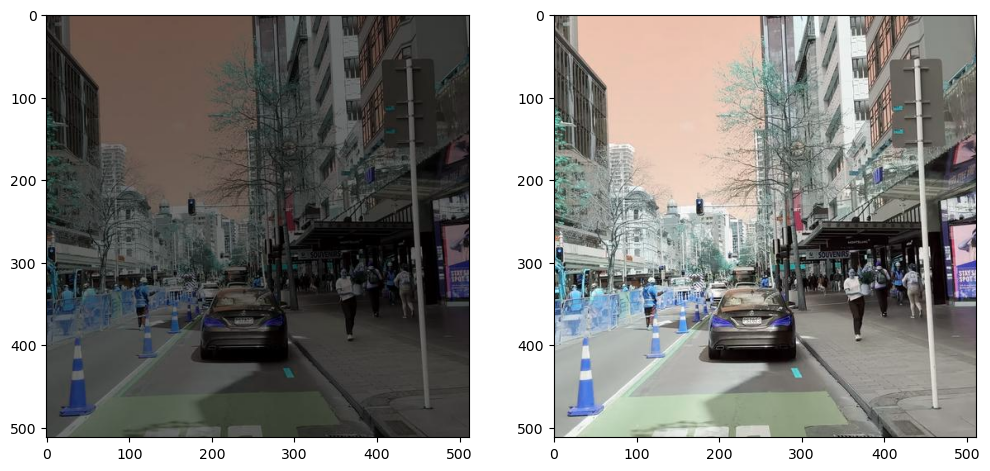

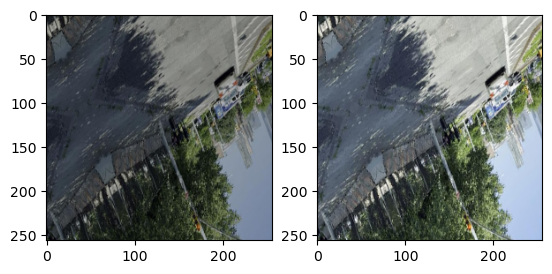

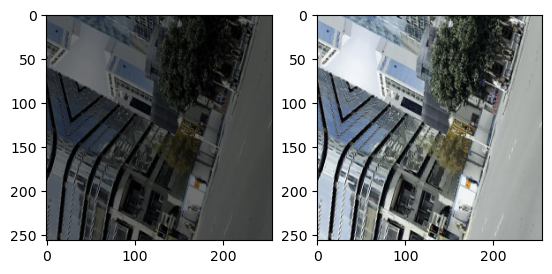

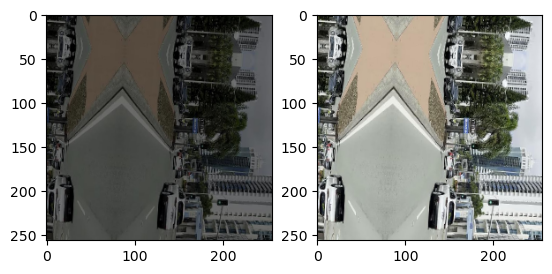

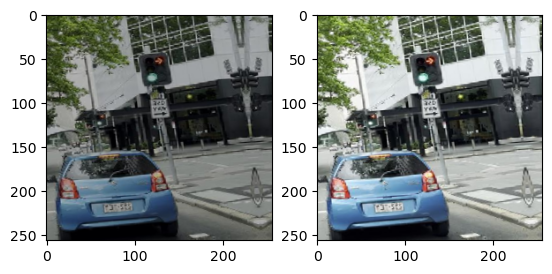

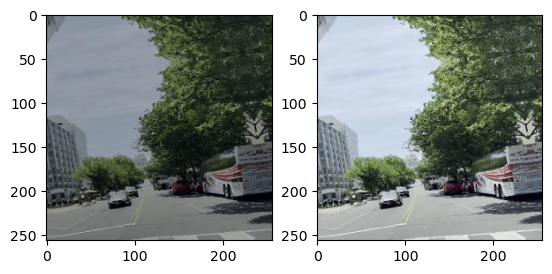

Epoch 1/20


I0000 00:00:1736886642.434002  210399 service.cc:146] XLA service 0x7ebcf4013e30 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1736886642.434018  210399 service.cc:154]   StreamExecutor device (0): NVIDIA GeForce RTX 4070 SUPER, Compute Capability 8.9
2025-01-14 22:30:42.507110: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2025-01-14 22:30:42.828335: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:531] Loaded cuDNN version 8907
2025-01-14 22:30:56.745688: W external/local_tsl/tsl/framework/bfc_allocator.cc:291] Allocator (GPU_0_bfc) ran out of memory trying to allocate 16.54GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2025-01-14 22:30:57.274437: W external/local_tsl/tsl/framework/bfc_allocator.cc:

   1/3000 ━━━━━━━━━━━━━━━━━━━━ 16:09:22 19s/step - accuracy: 0.1121 - loss: 0.6918 - precision: 0.9999 - recall: 0.6485

I0000 00:00:1736886660.056474  210399 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - accuracy: 0.6618 - loss: 0.5856 - precision: 1.0000 - recall: 0.6945

2025-01-14 22:38:37.282874: W external/local_tsl/tsl/framework/bfc_allocator.cc:291] Allocator (GPU_0_bfc) ran out of memory trying to allocate 8.71GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2025-01-14 22:38:37.734752: W external/local_tsl/tsl/framework/bfc_allocator.cc:291] Allocator (GPU_0_bfc) ran out of memory trying to allocate 8.46GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2025-01-14 22:38:38.289201: W external/local_tsl/tsl/framework/bfc_allocator.cc:291] Allocator (GPU_0_bfc) ran out of memory trying to allocate 8.44GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2025-01-14 22:38:38.627539: W external/local_tsl/tsl/framework/bfc_

3000/3000 ━━━━━━━━━━━━━━━━━━━━ 739s 240ms/step - accuracy: 0.6618 - loss: 0.5856 - precision: 1.0000 - recall: 0.6945 - val_accuracy: 0.7541 - val_loss: 0.6897 - val_precision: 1.0000 - val_recall: 0.2118
Epoch 2/20
3000/3000 ━━━━━━━━━━━━━━━━━━━━ 721s 240ms/step - accuracy: 0.7890 - loss: 0.5480 - precision: 1.0000 - recall: 0.6687 - val_accuracy: 0.8112 - val_loss: 0.6787 - val_precision: 1.0000 - val_recall: 0.2420
Epoch 3/20
3000/3000 ━━━━━━━━━━━━━━━━━━━━ 712s 237ms/step - accuracy: 0.8050 - loss: 0.5478 - precision: 1.0000 - recall: 0.6707 - val_accuracy: 0.8096 - val_loss: 0.7203 - val_precision: 1.0000 - val_recall: 0.1376
Epoch 4/20
3000/3000 ━━━━━━━━━━━━━━━━━━━━ 710s 237ms/step - accuracy: 0.6524 - loss: 0.6329 - precision: 1.0000 - recall: 0.6778 - val_accuracy: 0.6815 - val_loss: 0.7076 - val_precision: 1.0000 - val_recall: 0.1851
Epoch 5/20
3000/3000 ━━━━━━━━━━━━━━━━━━━━ 708s 236ms/step - accuracy: 0.7623 - loss: 0.5503 - precision: 1.0000 - recall: 0.6710 - val_accuracy: 0.

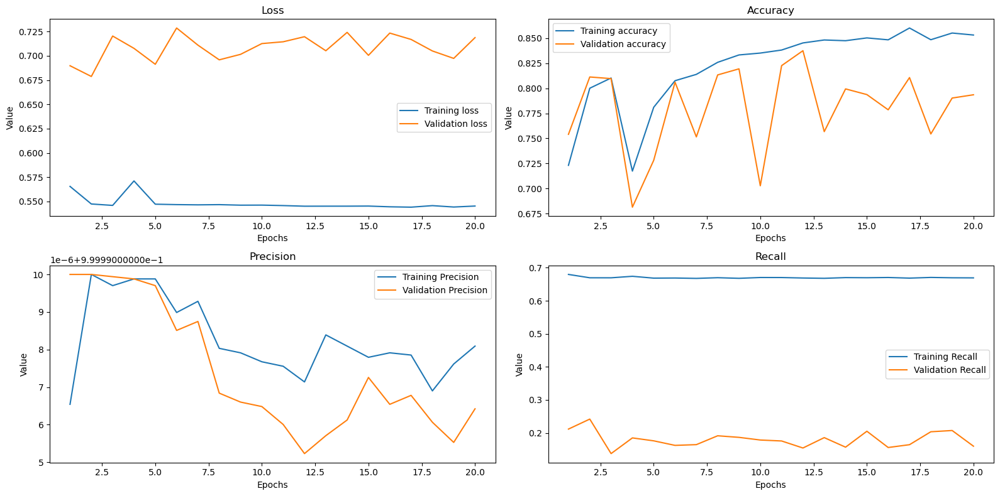

In [2]:


High_images = "/home/el7agadel/masters/image processing/project/LoLI-Street Dataset/Train/High/"
Low_images = "/home/el7agadel/masters/image processing/project/LoLI-Street Dataset/Train/Low/"



network = Unet(low_path_train = Low_images, high_path_train = High_images, low_path_test = Low_images, high_path_test = High_images, num_epochs = 20, batch_size = 10, img_Width = 256, img_Height = 256, img_Depth = 3, valid_split=0.35)

Model = network.Create_U2NET()
train_gen, valid_gen = network.Data_Generation()
network.Model_Specs(Model)
network.Review_Training_data()
network.Reviw_Gen_Data()
save_path = "/home/el7agadel/masters/image processing/project/lol_dataset/Unet2.h5"

network.Run_Training(model=Model, Save_path = save_path, train_gen=train_gen, valid_gen=valid_gen)


I0000 00:00:1736900836.379362  210126 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1736900836.414365  210126 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1736900836.416552  210126 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1736900836.465649  210126 cuda_executor.cc:1015] successful NUMA node read from SysFS ha

in model training model
in model testing model
1.png 1.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


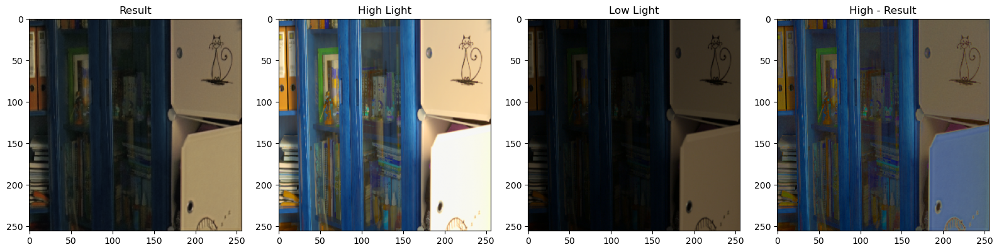

111.png 111.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step


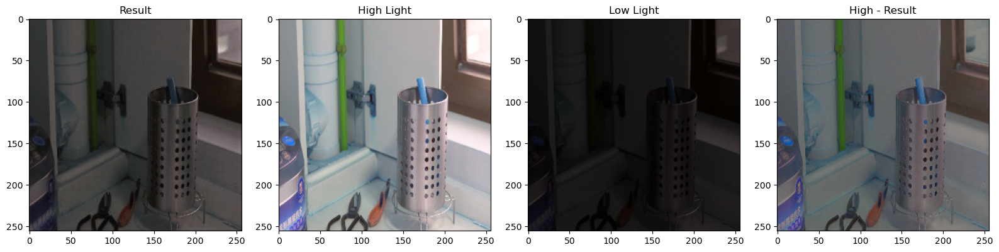

146.png 146.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


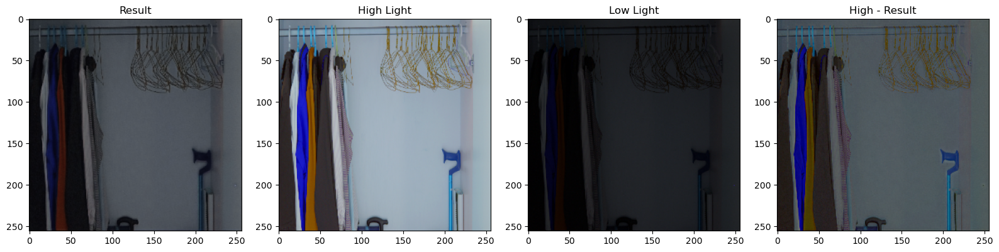

179.png 179.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step


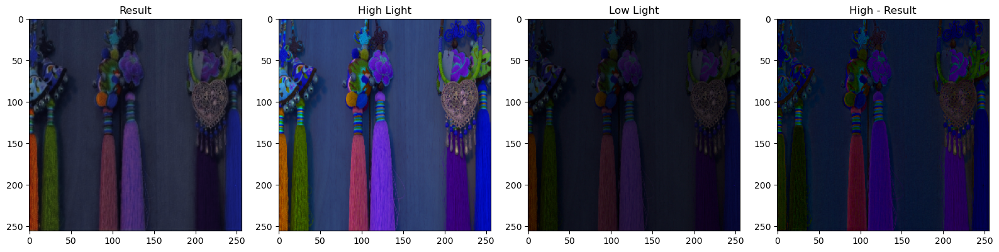

22.png 22.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


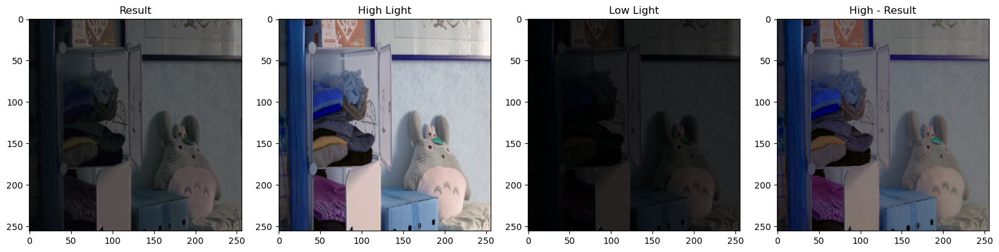

23.png 23.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


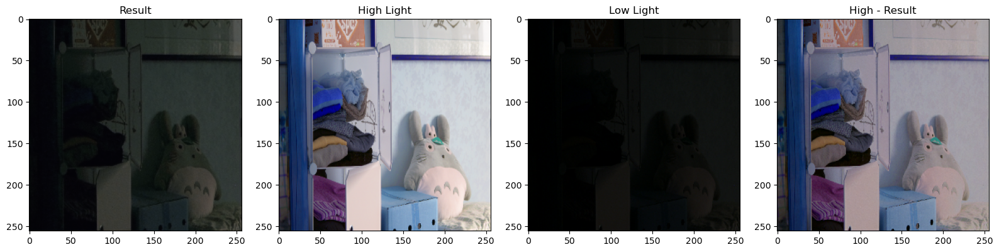

493.png 493.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


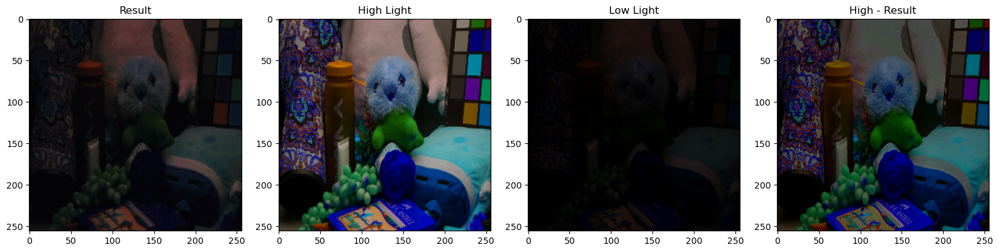

547.png 547.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


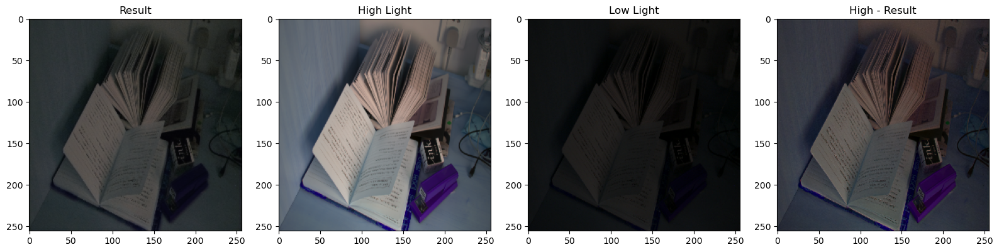

55.png 55.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


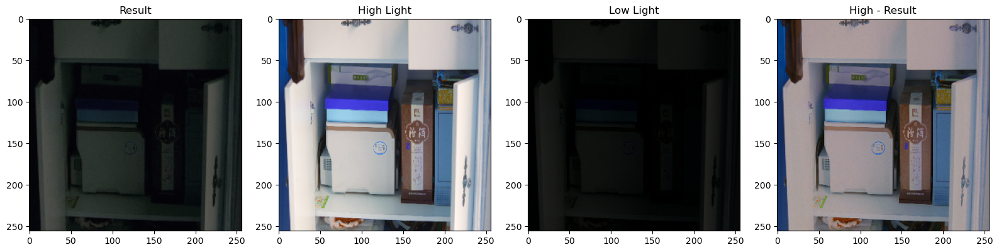

665.png 665.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


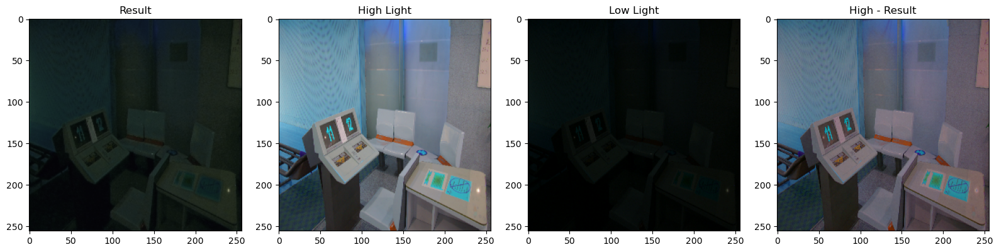

669.png 669.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


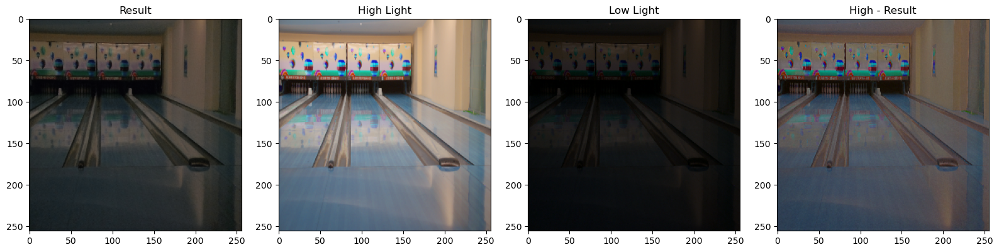

748.png 748.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


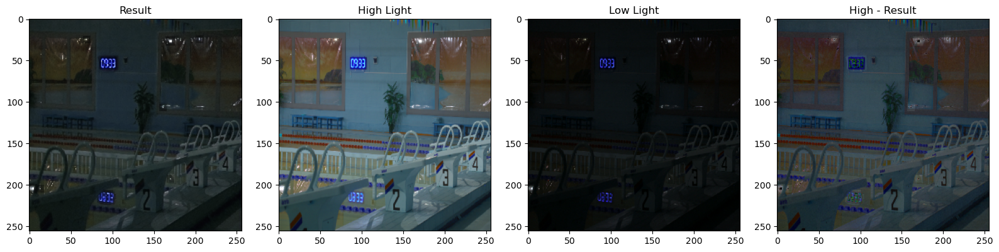

778.png 778.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


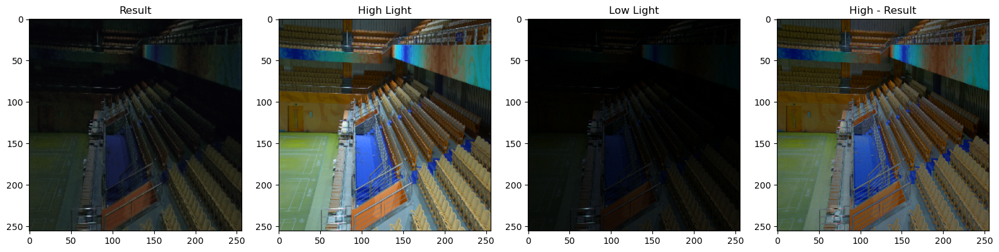

780.png 780.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


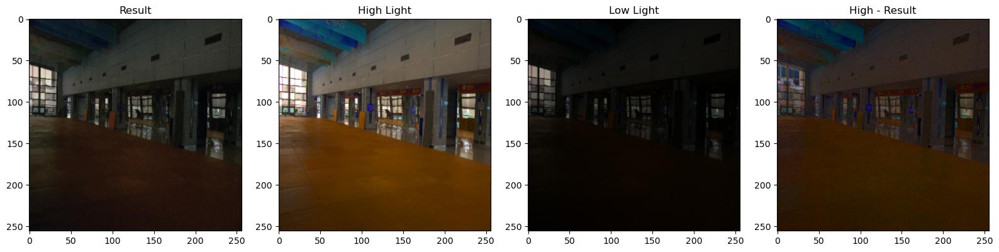

79.png 79.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


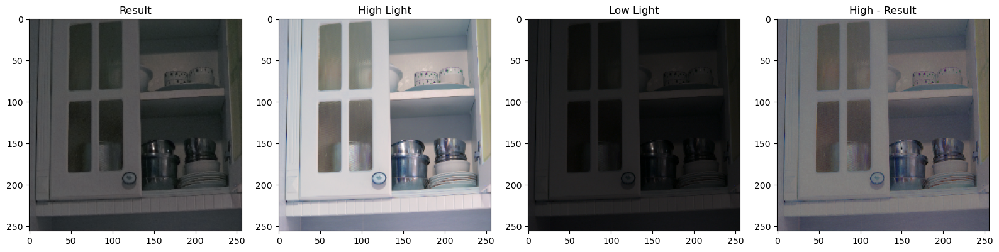

In [3]:

model_path = "/home/el7agadel/masters/image processing/project/lol_dataset/Unet2.h5"
High_images_test = "/home/el7agadel/masters/image processing/project/lol_dataset/eval15/High/Images/"
Low_images_test = "/home/el7agadel/masters/image processing/project/lol_dataset/eval15/Low/Images/"

network = Unet(img_Width = 256, img_Height = 256, img_Depth = 3)

network.Review_Model(model_path, High_images_test, Low_images_test)